In [2]:
# Initial imports
import pandas as pd
from sklearn import tree
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import matplotlib.pyplot as plt    

# Needed for decision tree visualization
#import pydotplus
#from IPython.display import Image

In [3]:
# Read in the data
file_path_ad_clean = "../Raw_data/application_data_cleaned_ros.csv"
df_loans = pd.read_csv(file_path_ad_clean)
df_loans.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
3,0,Cash loans,F,Y,Y,1,171000.0,1560726.0,41301.0,1395000.0,...,0,0,0,0,0.0,0.0,0.0,1.0,1.0,2.0
4,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,1530000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
# convert text to numbers for model
df_loans = pd.get_dummies(df_loans)

In [5]:
# Define features set
X = df_loans.copy()
X.drop("TARGET", axis=1, inplace=True)
X.head()

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University
0,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,-3648.0,-2120,...,False,False,False,False,False,False,False,False,False,False
1,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,-4260.0,-2531,...,False,False,False,False,False,False,False,False,False,False
2,0,99000.0,490495.5,27517.5,454500.0,0.035792,-16941,-1588,-4970.0,-477,...,False,False,False,False,False,False,False,False,False,False
3,1,171000.0,1560726.0,41301.0,1395000.0,0.035792,-13778,-3130,-1213.0,-619,...,False,False,False,False,False,False,False,False,False,False
4,0,360000.0,1530000.0,42075.0,1530000.0,0.003122,-18850,-449,-4597.0,-2379,...,False,False,False,False,False,False,False,False,False,False


In [6]:
# Define target vector
y = df_loans["TARGET"].values.reshape(-1, 1)
y[:5]

array([[1],
       [0],
       [0],
       [0],
       [0]], dtype=int64)

In [7]:
# Check if data is balanced
data_check = df_loans["TARGET"].value_counts()
data_check

TARGET
0    153525
1     14207
Name: count, dtype: int64

In [8]:
# Oversample the data as it is imbalanced
from imblearn.over_sampling import RandomOverSampler
sampling_strategy = 1
ros = RandomOverSampler(sampling_strategy=sampling_strategy)
X_res, y_res = ros.fit_resample(X, y)
y_res_df = pd.DataFrame(y_res)

In [9]:
# Verify the oversampling worked
y_res_df.value_counts()

0    153525
1    153525
Name: count, dtype: int64

In [10]:
# Splitting into Train and Test sets
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, random_state=24)

In [11]:
# Create the StandardScaler instance
scaler = StandardScaler()

In [12]:
# Fit the Standard Scaler with the training data
X_scaler = scaler.fit(X_train)

c:\Python312\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
c:\Python312\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
c:\Python312\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [13]:
# Scale the training data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

c:\Python312\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
c:\Python312\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
c:\Python312\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
c:\Python312\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.

In [14]:
# Create the decision tree classifier instance
model = tree.DecisionTreeClassifier()

In [15]:
# Fit the model
model = model.fit(X_train_scaled, y_train)

In [16]:
# Making predictions using the testing data
predictions = model.predict(X_test_scaled)

In [17]:
# Calculating the confusion matrix
cm = confusion_matrix(y_test, predictions)
cm_df = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"]
)

# Calculating the accuracy score
acc_score = accuracy_score(y_test, predictions)

In [18]:
# Displaying results
print("Confusion Matrix")
display(cm_df)
print(f"Accuracy Score : {acc_score}")
print("Classification Report")
print(classification_report(y_test, predictions))

Confusion Matrix


,Predicted 0,Predicted 1
Actual 0,34033,4113
Actual 1,2,38615


Accuracy Score : 0.9463934447585425
Classification Report
              precision    recall  f1-score   support

           0       1.00      0.89      0.94     38146
           1       0.90      1.00      0.95     38617

    accuracy                           0.95     76763
   macro avg       0.95      0.95      0.95     76763
weighted avg       0.95      0.95      0.95     76763



In [19]:
# feature importance plot
feature_importance = model.feature_importances_
# sort them
sorted(zip(model.feature_importances_, X.columns), reverse=True)

[(0.13436555739417058, 'EXT_SOURCE_3'),
 (0.10481531169622325, 'EXT_SOURCE_2'),
 (0.05599880458114158, 'DAYS_EMPLOYED'),
 (0.05349720527525226, 'DAYS_BIRTH'),
 (0.05218148859883763, 'DAYS_REGISTRATION'),
 (0.05041613493293081, 'DAYS_ID_PUBLISH'),
 (0.04333484749243588, 'DAYS_LAST_PHONE_CHANGE'),
 (0.04280895132340325, 'AMT_ANNUITY'),
 (0.039038454339186554, 'REGION_POPULATION_RELATIVE'),
 (0.033940685622552126, 'AMT_CREDIT'),
 (0.0300863022465237, 'AMT_INCOME_TOTAL'),
 (0.028843724545854814, 'HOUR_APPR_PROCESS_START'),
 (0.026116273102138238, 'AMT_GOODS_PRICE'),
 (0.016780411314696608, 'AMT_REQ_CREDIT_BUREAU_YEAR'),
 (0.008792959648520296, 'OBS_60_CNT_SOCIAL_CIRCLE'),
 (0.008335444049831654, 'OBS_30_CNT_SOCIAL_CIRCLE'),
 (0.007801350323482511, 'NAME_EDUCATION_TYPE_Higher education'),
 (0.007360228177889348, 'AMT_REQ_CREDIT_BUREAU_MON'),
 (0.006867138874713739, 'AMT_REQ_CREDIT_BUREAU_QRT'),
 (0.006491901741648686, 'CNT_FAM_MEMBERS'),
 (0.005344755860330648, 'DEF_30_CNT_SOCIAL_CIRCLE'),


<Axes: title={'center': 'Features Importances'}, ylabel='1'>

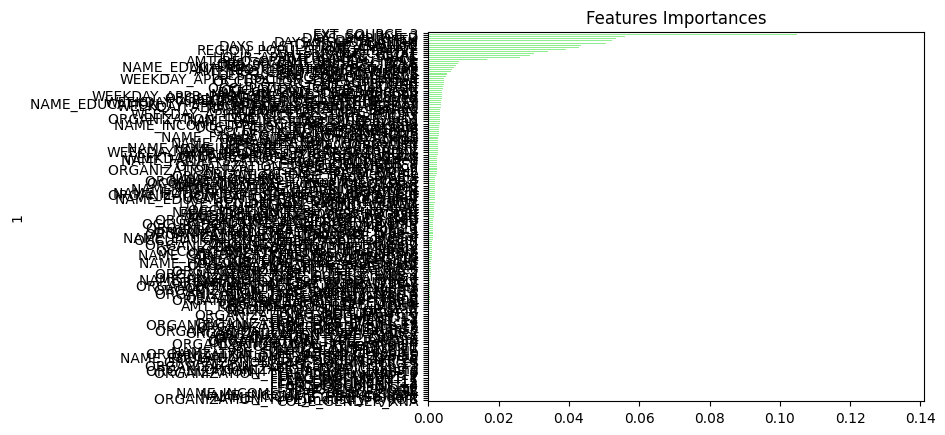

In [20]:
# Visualize the features by importance
importances_df = pd.DataFrame(sorted(zip(model.feature_importances_, X.columns), reverse=True))
importances_df.set_index(importances_df[1], inplace=True)
importances_df.drop(columns=1, inplace=True)
importances_df.rename(columns={0: 'Feature Importances'}, inplace=True)
importances_sorted = importances_df.sort_values(by='Feature Importances')
importances_sorted.plot(kind='barh', color='lightgreen', title= 'Features Importances', legend=False)

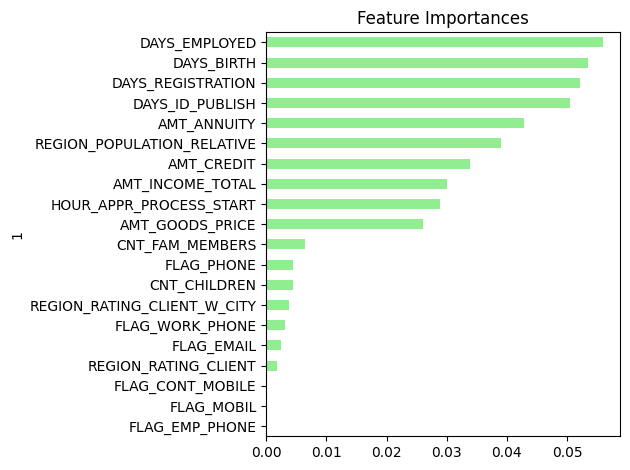

In [33]:
# Visualize the top 20 features by importance
importances_df = pd.DataFrame(sorted(zip(model.feature_importances_, X.columns[:20]), reverse=True))
importances_df.set_index(importances_df[1], inplace=True)
importances_df.drop(columns=1, inplace=True)
importances_df.rename(columns={0: 'Feature Importances'}, inplace=True)
importances_sorted = importances_df.sort_values(by='Feature Importances')
figure_bar_chart = importances_sorted.plot(kind='barh', color='lightgreen', title= 'Feature Importances', legend=False)
plt.tight_layout()
plt.savefig("feature_importances_top20_figure.png")

In [34]:
#text tree
text_representation = tree.export_text(model)
print(text_representation)

|--- feature_27 <= -0.17
|   |--- feature_26 <= -0.11
|   |   |--- feature_27 <= -0.98
|   |   |   |--- feature_26 <= -1.00
|   |   |   |   |--- feature_26 <= -1.96
|   |   |   |   |   |--- feature_5 <= 3.11
|   |   |   |   |   |   |--- feature_7 <= -3.43
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_7 >  -3.43
|   |   |   |   |   |   |   |--- feature_134 <= 9.15
|   |   |   |   |   |   |   |   |--- feature_34 <= -0.72
|   |   |   |   |   |   |   |   |   |--- feature_8 <= -1.11
|   |   |   |   |   |   |   |   |   |   |--- feature_19 <= -0.49
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |   |   |   |   |   |   |   |--- feature_19 >  -0.49
|   |   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |--- feature_8 >  -1.11
|   |   |   |   |   |   |   |   |   |   |--- feature_7 <= 0.94
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 26
|   |   |   |   | 

In [35]:
columns_names = X.columns.tolist()
fig = plt.figure(figsize=(100,100))
tree_figure = tree.plot_tree(model, feature_names = columns_names, class_names=["0", "1"], filled=True)

In [36]:
fig.savefig("decistion_tree_large.png")